# Context

Imagine that you are a data scientist who was just hired by the LendingClub.
They want to automate their lending decisions fully, and they hired you to lead this project.
Your team consists of a product manager to help you understand the business domain and a software engineer who will help you integrate your solution into their product.
During the initial investigations, you've found that there was a similar initiative in the past, and luckily for you, they have left a somewhat clean dataset of LendingClub's loan data.
The dataset is located in a public bucket here: <https://storage.googleapis.com/335-lending-club/lending-club.zip> (although you were wondering if having your client data in a public bucket is such a good idea).
In the first meeting with your team, you all have decided to use this dataset because it will allow you to skip months of work of building a dataset from scratch.
In addition, you have decided to tackle this problem iteratively so that you can get test your hypothesis that you can automate these decisions and get actual feedback from the users as soon as possible.
For that, you have proposed a three-step plan on how to approach this problem.
The first step of your plan is to create a machine learning model to classify loans into accepted/rejected so that you can start learning if you have enough data to solve this simple problem adequately.
The second step is to predict the grade for the loan, and the third step is to predict the subgrade.
Your team likes the plan, especially because after every step, you'll have a fully-working deployed model that your company can use.
Excitedly you get to work!


# 1.Setup

In [ ]:
!pip install pywaffle

In [ ]:
# Data analysis and calculation
import pandas as pd
import numpy as np
from additional_functions import *

# Data visualization
import seaborn as sns
import matplotlib.pyplot as plt
from pywaffle import Waffle
from yellowbrick.features import FeatureImportances
from yellowbrick.classifier import ROCAUC
import plotly.express as px
from wordcloud import WordCloud, STOPWORDS

plt.rcParams["figure.dpi"] = 200


# Statistical modules
import statsmodels.stats.api as sms
from scipy.stats import ttest_ind
import collections

import joblib

# Warnings handling and import
import warnings


warnings.simplefilter(action="ignore", category=FutureWarning)

#   2.Data Cleaning

## 2.1 Accepted loans dataframe

In [ ]:
path = "accepted_2007_to_2018Q4.csv"
accepted_loan_df = pd.read_csv(path)

path = "rejected_2007_to_2018Q4.csv"
rejected_loan_df = pd.read_csv(path)

/Users/edvardsivickij/opt/anaconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3444: DtypeWarning: Columns (0,19,49,59,118,129,130,131,134,135,136,139,145,146,147) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [ ]:
accepted_loan_df.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,hardship_payoff_balance_amount,hardship_last_payment_amount,disbursement_method,debt_settlement_flag,debt_settlement_flag_date,settlement_status,settlement_date,settlement_amount,settlement_percentage,settlement_term
0,68407277,NaN,3600.0,3600.0,3600.0,36 months,13.99,123.03,C,C4,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN
1,68355089,NaN,24700.0,24700.0,24700.0,36 months,11.99,820.28,C,C1,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN
2,68341763,NaN,20000.0,20000.0,20000.0,60 months,10.78,432.66,B,B4,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN
3,66310712,NaN,35000.0,35000.0,35000.0,60 months,14.85,829.90,C,C5,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN
4,68476807,NaN,10400.0,10400.0,10400.0,60 months,22.45,289.91,F,F1,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
accepted_loan_df[accepted_loan_df.duplicated("id")].head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,hardship_payoff_balance_amount,hardship_last_payment_amount,disbursement_method,debt_settlement_flag,debt_settlement_flag_date,settlement_status,settlement_date,settlement_amount,settlement_percentage,settlement_term


In [ ]:
accepted_loan_df.isnull().sum().head(10)

id                       0
member_id          2260701
loan_amnt               33
funded_amnt             33
funded_amnt_inv         33
term                    33
int_rate                33
installment             33
grade                   33
sub_grade               33
dtype: int64

We have to big data sets so there is no enough free Ram so outliers will be droped.

In [ ]:
Q1 = accepted_loan_df.quantile(0.1)
Q3 = accepted_loan_df.quantile(0.9)
IQR = Q3 - Q1

outliers_df = (accepted_loan_df < (Q1 - 1.5 * IQR)) | (
    accepted_loan_df > (Q3 + 1.5 * IQR)
)

(
    (accepted_loan_df < (Q1 - 1.5 * IQR)) | (accepted_loan_df > (Q3 + 1.5 * IQR))
).sum().head()

acc_now_delinq           8782
acc_open_past_24mths     2379
addr_state                  0
all_util                   33
annual_inc              22354
dtype: int64

In [ ]:
accepted_loan_df = accepted_loan_df[
    ~(
        (accepted_loan_df < (Q1 - 1.5 * IQR)) | (accepted_loan_df > (Q3 + 1.5 * IQR))
    ).any(axis=1)
]

We have a lot of columns with null values, but for the EDA part I will keep most of them

In [ ]:
accepted_loan_df = (
    accepted_loan_df.pipe(drop_null)
    .pipe(drop_columns, ["member_id"])
    .pipe(replace_int, "dti", 0, 100, 100)
)
accepted_loan_df = replace_emp_length(accepted_loan_df, "emp_length")

I'm discarding null values only from columns that had less than 65 values. I also deleted an unnecessary column.

## 2.2 Rejected loans dataframe

In [ ]:
rejected_loan_df.head()

,Amount Requested,Application Date,Loan Title,Risk_Score,Debt-To-Income Ratio,Zip Code,State,Employment Length,Policy Code
0,1000.0,2007-05-26,Wedding Covered but No Honeymoon,693.0,10%,481xx,NM,4 years,0.0
1,1000.0,2007-05-26,Consolidating Debt,703.0,10%,010xx,MA,< 1 year,0.0
2,11000.0,2007-05-27,Want to consolidate my debt,715.0,10%,212xx,MD,1 year,0.0
3,6000.0,2007-05-27,waksman,698.0,38.64%,017xx,MA,< 1 year,0.0
4,1500.0,2007-05-27,mdrigo,509.0,9.43%,209xx,MD,< 1 year,0.0


In [ ]:
rejected_loan_df[rejected_loan_df.duplicated("Loan Title")].head()

,Amount Requested,Application Date,Loan Title,Risk_Score,Debt-To-Income Ratio,Zip Code,State,Employment Length,Policy Code
1088,8275.0,2007-09-24,Travel Resorts of America,763.0,4.17%,287xx,NC,10+ years,0.0
1238,2400.0,2007-09-30,udi,666.0,5.53%,655xx,MO,< 1 year,0.0
1365,5100.0,2007-10-04,Personal Loan,618.0,7.73%,916xx,AL,1 year,0.0
2139,25000.0,2007-10-28,Personal Loan,700.0,2.37%,844xx,UT,8 years,0.0
2308,8625.0,2007-11-02,Consolidate Debt,686.0,23.63%,109xx,NY,3 years,0.0


We have several similar Loan titles, but, with the exception of this, we don't have duplicate entries.

In [ ]:
accepted_loan_df.dtypes.head()

id                  object
loan_amnt          float64
funded_amnt        float64
funded_amnt_inv    float64
term                object
dtype: object

In [ ]:
rejected_loan_df.isnull().sum()

Amount Requested               0
Application Date               0
Loan Title                  1303
Risk_Score              18497630
Debt-To-Income Ratio           0
Zip Code                     293
State                         22
Employment Length         951355
Policy Code                  918
dtype: int64

We also have a lot of null values, most of them will be left for now. In addition, one feature will be changed to numeric

In [ ]:
Q1 = rejected_loan_df.quantile(0.1)
Q3 = rejected_loan_df.quantile(0.9)
IQR = Q3 - Q1

outliers_df = (rejected_loan_df < (Q1 - 1.5 * IQR)) | (
    rejected_loan_df > (Q3 + 1.5 * IQR)
)

((rejected_loan_df < (Q1 - 1.5 * IQR)) | (rejected_loan_df > (Q3 + 1.5 * IQR))).sum()

Amount Requested        111420
Application Date             0
Debt-To-Income Ratio         0
Employment Length            0
Loan Title                   0
Policy Code              88129
Risk_Score               87949
State                        0
Zip Code                     0
dtype: int64

Same situation with rejected dataset there are more than 27 millions data points

In [ ]:
rejected_loan_df = rejected_loan_df[
    ~(
        (rejected_loan_df < (Q1 - 1.5 * IQR)) | (rejected_loan_df > (Q3 + 1.5 * IQR))
    ).any(axis=1)
]

We have a lot of risk score outliers because there are incorrect values. In this particular case, FICO and VantageScore were used to calculate the risk score. Their range is from 300 to 850, and in this dataset, the values ranged from 0 to 850. All incorrect values were discarded.

In [ ]:
rejected_loan_df = (
    rejected_loan_df.pipe(drop_null)
    .pipe(cat_to_int, ["Debt-To-Income Ratio"])
    .pipe(replace_int, "Debt-To-Income Ratio", 0, 100, 100)
)
rejected_loan_df = replace_emp_length(rejected_loan_df, "Employment Length")

In [ ]:
rejected_loan_df = rejected_loan_df[~(rejected_loan_df["Risk_Score"] < 300)]

We have a lot of risk score outliers because there are incorrect values. In this particular case, FICO and VantageScore were used to calculate the risk score. Their range is from 300 to 850, and in this dataset, the values ranged from 0 to 850. All incorrect values were discarded.

In [ ]:
accepted_loan_df = accepted_loan_df.sample(frac=0.5)
rejected_loan_df = rejected_loan_df.sample(frac=0.3)

## 2.3 Descriptive statistics

### 2.3.1 Accepted loans statistics

In [ ]:
accepted_loan_df.describe().round(1)

,loan_amnt,funded_amnt,funded_amnt_inv,int_rate,installment,emp_length,annual_inc,dti,delinq_2yrs,fico_range_low,...,deferral_term,hardship_amount,hardship_length,hardship_dpd,orig_projected_additional_accrued_interest,hardship_payoff_balance_amount,hardship_last_payment_amount,settlement_amount,settlement_percentage,settlement_term
count,703444.0,703444.0,703444.0,703444.0,703444.0,660243.0,703444.0,703444.0,703444.0,703444.0,...,1539.0,1539.0,1539.0,1539.0,1356.0,1539.0,1539.0,759.0,759.0,759.0
mean,14345.9,14339.8,14325.9,12.6,425.0,5.9,71388.5,18.6,0.1,702.7,...,3.0,140.7,3.0,9.4,414.5,11225.5,185.8,4684.4,48.9,13.8
std,8613.3,8610.9,8612.1,4.6,250.4,3.7,37343.5,8.8,0.4,33.4,...,0.0,109.8,0.0,9.1,321.8,7334.0,193.4,3863.4,6.7,7.9
min,500.0,500.0,0.0,5.3,4.9,0.0,0.0,0.0,0.0,640.0,...,3.0,3.8,3.0,0.0,15.6,424.1,0.0,195.0,22.6,0.0
25%,8000.0,8000.0,8000.0,9.2,246.1,2.0,45000.0,12.1,0.0,675.0,...,3.0,56.7,3.0,0.0,166.7,5508.7,28.6,1865.0,45.0,8.0
50%,12000.0,12000.0,12000.0,12.0,366.6,6.0,63000.0,18.0,0.0,695.0,...,3.0,113.6,3.0,9.0,333.6,9695.8,128.3,3590.0,45.1,18.0
75%,20000.0,20000.0,20000.0,15.0,558.3,10.0,89000.0,24.4,0.0,720.0,...,3.0,194.4,3.0,16.0,574.9,15240.9,285.7,6374.0,50.0,18.0
max,40000.0,40000.0,40000.0,31.0,1714.5,10.0,274000.0,100.0,2.0,845.0,...,3.0,718.2,3.0,37.0,2154.8,37687.0,1104.4,22900.0,75.0,24.0


In [ ]:
accepted_loan_df.groupby("application_type")["dti"].describe().round(2).reset_index()

,application_type,count,mean,std,min,25%,50%,75%,max
0,Individual,669105.0,18.22,8.29,0.0,12.03,17.73,24.05,49.96
1,Joint App,34339.0,25.89,13.85,0.0,15.46,24.22,34.50,100.00


In [ ]:
accepted_loan_df.groupby("application_type")["annual_inc"].describe().round(
    2
).reset_index()

,application_type,count,mean,std,min,25%,50%,75%,max
0,Individual,669105.0,71997.05,37483.18,2000.0,45000.0,64500.0,90000.0,274000.0
1,Joint App,34339.0,59530.24,32296.34,0.0,37436.0,53000.0,75000.0,271036.0


**LendingClub requirements and thresholds:**
* personal loans between $\$$1,000 and $\$$40,000
* debt-to-income ratio under 40%
* fico  score should be good (670–739) or excellent (800 and above). Some applications could be accepted with medium (fair) fico score but not lower than 600. 

* Insights:

 * Joint applications have a maximum value of 100, which is probably an outlier or incorrect values, because, as indicated earlier, such figures do not comply with the norms.
 * We see that the annual income from individual applications is slightly more
 

### 2.3.1 Rejected loans statistics

In [ ]:
rejected_loan_df.describe().round(2)

,Amount Requested,Risk_Score,Debt-To-Income Ratio,Employment Length,Policy Code
count,8209185.00,2715189.00,8209185.00,7925972.00,8209185.0
mean,12558.49,634.02,27.80,0.71,0.0
std,10840.66,65.78,27.29,1.95,0.0
min,50.00,300.00,0.00,0.00,0.0
25%,4500.00,593.00,8.33,0.00,0.0
50%,10000.00,637.00,20.16,0.00,0.0
75%,20000.00,675.00,36.78,0.00,0.0
max,72000.00,968.00,100.00,10.00,0.0


In [ ]:
rejected_loan_df.describe(include="object")

,Application Date,Loan Title,Zip Code,State
count,8209185,8209185,8209185,8209185
unique,4226,24279,1001,51
top,2018-12-04,Debt consolidation,112xx,CA
freq,12652,1915149,78777,961231


* Max amount requested is 72000 which is much higher than LendingClub provides
* Most frequent purpose for rejected applications is debt consolidation
* The most frequent country for rejected applications is California
* Average dti is much higher compared to accepted group

# 3.EDA

## 3.1 Number of approved and unapproved loans

Lets start from checking how big difference is bettween this two groups.

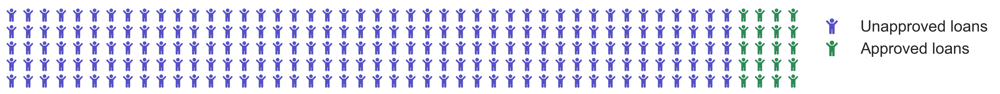

In [ ]:
plots = Plots(accepted_loan_df, rejected_loan_df)
plots.population_plot()

* We see how big the difference is between those who received a loan and those who did not
* Ratio between this two groups is almost 1:11
* It is assumed that it is not so easy to get a loan

## 3.2 Number of accepted and rejeted loans aroudn US

In this part, I will study which states had the largest number of approved and rejected loans. We will also check which is more common - rejection or acceptance.

In [ ]:
rejected_states = group_by(rejected_loan_df, ["State"], "State")
approved_states = group_by(accepted_loan_df, ["addr_state"], "addr_state")

In [ ]:
plots = Plots(approved_states, rejected_states)
plots.map_plot()

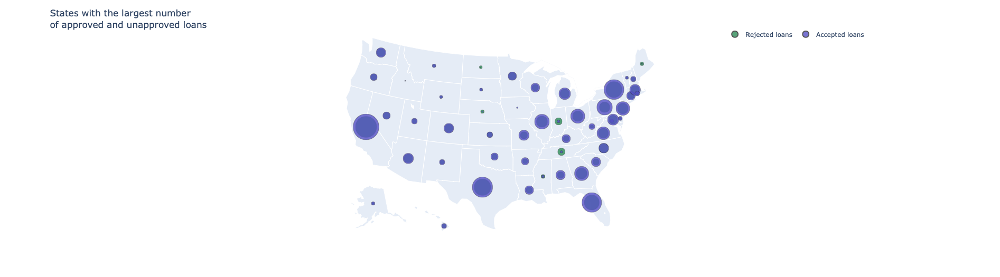

## 3.3 Annual income

In this case there is no data for rejected loans and limited data will be studied.

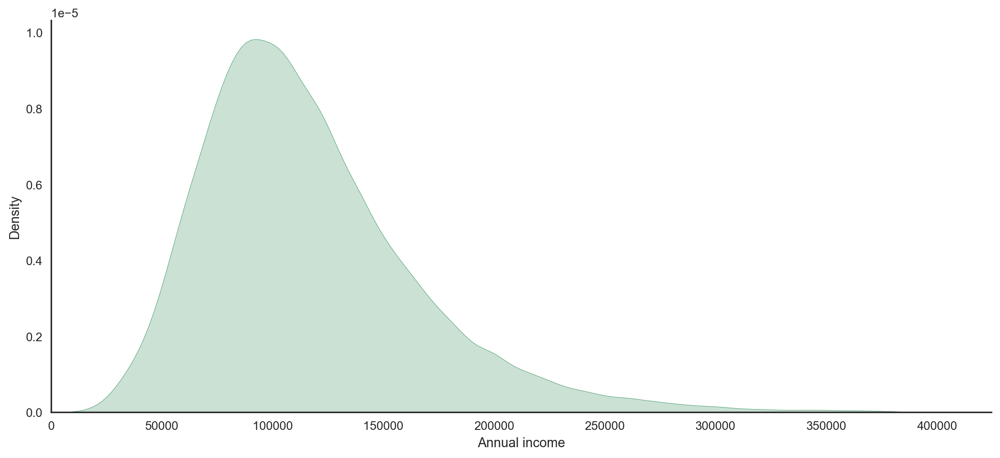

In [ ]:
cxplots = Plots(accepted_loan_df, rejected_loan_df)
plots.dist_plot("annual_inc_joint", "Annual income")

Conclusion:

* The distribution is left skewed and it shows that a person on average has an annual income of 100,000.

* This feature had outliers that showed that there are people who have an above-average income equal to 400 000 - 500 000. The number of these people is quite small.

## 3.4 Requested amounts

In this subsection, I will check the difference between the requested loan amounts between the two groups. This can help to understand whether the size of the loan has a positive impact on the decision.

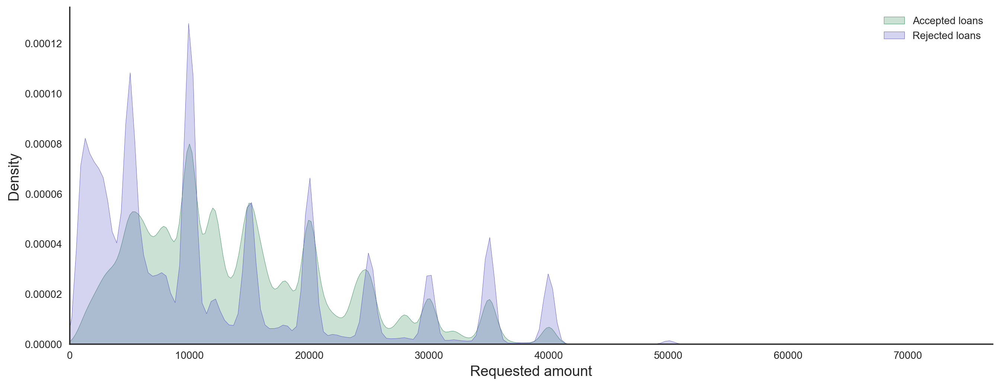

In [ ]:
plots.kde_plot(
    "loan_amnt",
    "Amount Requested",
    "Requested amount",
    "Accepted loans",
    "Rejected loans",
)

From the plot:

* We see that in both groups, most people wanted rounded amounts, for example, 10,000.

* In the rejected group, people asked for larger amounts compared to the other group.

* Also, the approved group requested a more specific amount, not rounded up. This may indicate that these people knew exactly what size of loan they needed, and this may be a positive sign for the bank.

## 3.5 The difference between rejected and accepted groups

We have already definied the difference between two groups and in this part I will studie if this deference is significant. For this task I will form hypothesis:


$H_0$ - there is no difference in requested loan between rejected and accepted groups.

$H_a$ - Accepted group have requested a larger average loan than the rejected.

$\alpha = 0.05$

In [ ]:
accepted_loan_df["status"] = 1
rejected_loan_df["status"] = 0

In [ ]:
loans_accepted = group_for_hypothesis(
    accepted_loan_df, "status", "loan_amnt", "loan_amnt"
)
loans_rejected = group_for_hypothesis(
    rejected_loan_df, "status", "Amount Requested", "Amount Requested"
)
loan_status = pd.concat([loans_accepted, loans_rejected])

In [ ]:
loan_status

,status,mean,std,sample_size
0,1,14339.535628,8610.640927,703444
0,0,12560.220857,10841.205692,8209185


We see that the average loan amount is very different. In addition, the sample sizes are very different, so it is necessary to perform a power analysis.

In [ ]:
# differencce of two means
loan_status_mean = loan_status.iloc[0]["mean"] - loan_status.iloc[1]["mean"]
loan_status_mean

1779.3147706610507

In [ ]:
# estimated standard deviation
loan_status_est_std = np.sqrt(
    (loan_status.iloc[0]["std"] ** 2 + loan_status.iloc[1]["std"] ** 2) / 2
)
loan_status_est_std

9789.65980079781

In [ ]:
# effect size
loan_status_mean / loan_status_est_std

0.18175450494367998

To prevent p-hacking, a preliminary power analysis was carried out. After filling the calculator with the obtained values, the output of the total sample size was equal to 954. In conclusion, there should be no p-hacking.
Sample size calculator: [ai-therapy](https://www.ai-therapy.com/psychology-statistics/sample-size-calculator)

In [ ]:
no_loan = rejected_loan_df[(rejected_loan_df["status"] == 0)]["Amount Requested"]
yes_loan = accepted_loan_df[(accepted_loan_df["status"] == 1)]["loan_amnt"]

cm = sms.CompareMeans(sms.DescrStatsW(yes_loan), sms.DescrStatsW(no_loan))
lb, ub = cm.tconfint_diff(usevar="unequal")

print("Confidence Interval with 'sms' is from %0.4f to %0.4f" % (lb, ub))

Confidence Interval with 'sms' is from 1757.8697 to 1800.7598


The zero value does not fall within the boundaries of the confidence interval, which means that there is a significant difference between the average requested loan amount of people in the two groups.

In [ ]:
stat, p = ttest_ind(yes_loan, no_loan)

print("Using t-test from Python module:\nt_stat: %0.3f, \np_value: %0.3f" % (stat, p))

Using t-test from Python module:
t_stat: 134.078, 
p_value: 0.000


The P-value is less than 0.05, so we can reject the null hypothesis, which means that there is a significant difference. Even though more people have not received a loan, the approved group has asked for significantly larger loans.

 ## 3.6 Debt to income ratio

The main purpose of this part is to compare the debt-to-income ratio between the groups. This comparison will be divided based on the employment length.
NOTE: 0 means less than a year of work experience, and 10 is equal to ten or more years.

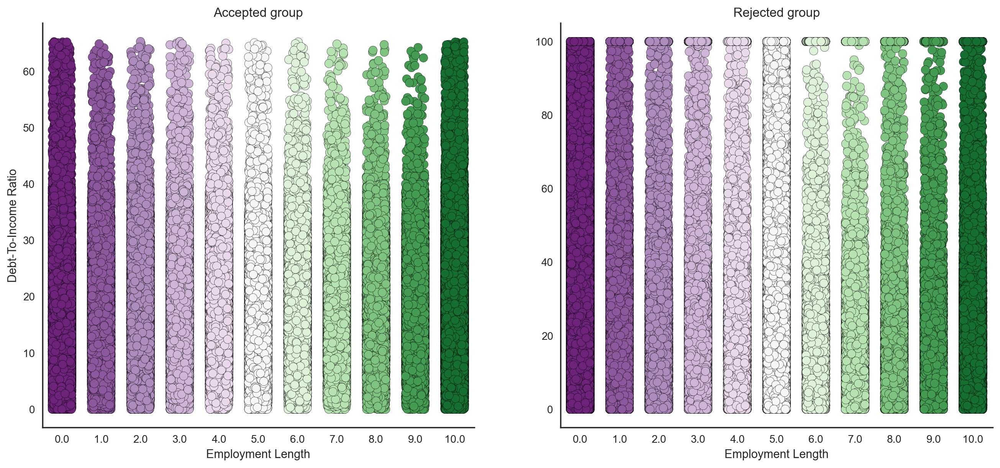

In [ ]:
plots.strip_plot_sub(
    "emp_length",
    "dti",
    "Employment Length",
    "Debt-To-Income Ratio",
    "Accepted group",
    "Rejected group",
)

Insights:

* According  to [credit.org](https://credit.org/blog/debt-to-income-ratio/) There are three main groups of debt-to-income ratios:

  *  35% or less - Good
  *  36-43% - Acceptable but Needs Work
  *  44% and up - Bad

* We can see that based on these groups, rejected groups have much more data points above 44%. This may be one of the reasons for the refusal.
* In the accepted group, we have only a few data points above 44%, and even they are smaller compared to the other group.
* The column of the rejected group, which represents people who have worked for less than 1 year, is the most densely filled.

**NOTE:** Rejected group has a vast set of values equal to 100. Because the column contained a large number of outliers. All large numbers have been replaced with 100

## 3.7 Changes over the years

We have quite long period of observations and in this part I will try to study how the trend changed over the years. If there were more favorable years for obtaining a loan.

In [ ]:
rejected_loan_df["Application Date"] = (
    rejected_loan_df["Application Date"].astype(str).str[:-6]
)
accepted_loan_df["issue_d"] = accepted_loan_df["issue_d"].astype(str).str[4:]

rejected_years = group_by(rejected_loan_df, ["Application Date"], "Application Date")
accepted_years = group_by(accepted_loan_df, ["issue_d"], "issue_d")

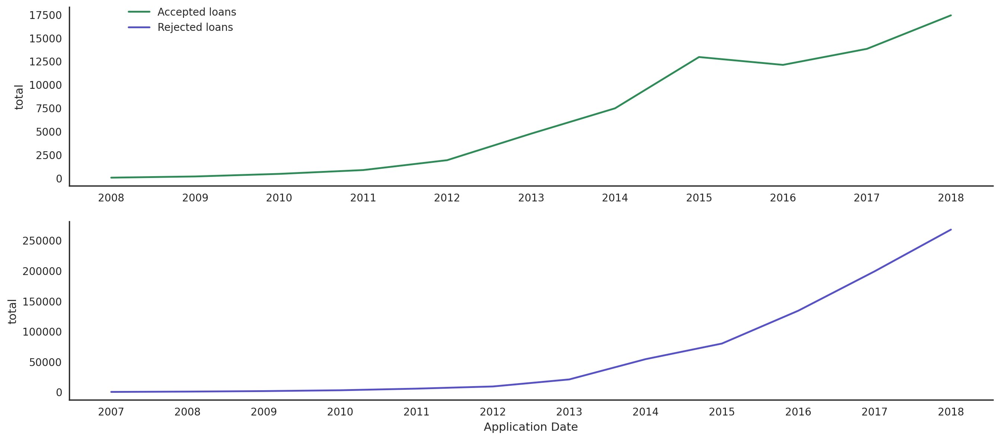

In [ ]:
plots = Plots(accepted_years, rejected_years)
plots.line_plot("issue_d", "total", "Application Date")

* We see that the number of rejected loans starts to grow up to 2011. This could be explained by the 2008 crisis. However, in this case, we would need alternative data on accepted loans to make a reasonable conclusion.
* Also for years until 2015 we have much less data, for instance for 2007 we have only 3 rows of data for accepted group.

## 3.8 Risk assessment vs Debt-To-Income Ratio

In this section I will try to check if there is any relationship between Risk Assessment and Debt-to-Income Ratio. I will also compare the results between these two groups. There are five main risk score groups:

* 300 - 575 Poor
* 580 - 669 Fair
* 670 - 739 Good
* 740 - 799 Very Good
* 800 - 850 Exceptional

In [ ]:
rejected_loan_df = cut(rejected_loan_df, "Risk_Score", "Risk_groups")
accepted_loan_df = cut(accepted_loan_df, "fico_range_high", "Risk_groups_acc")

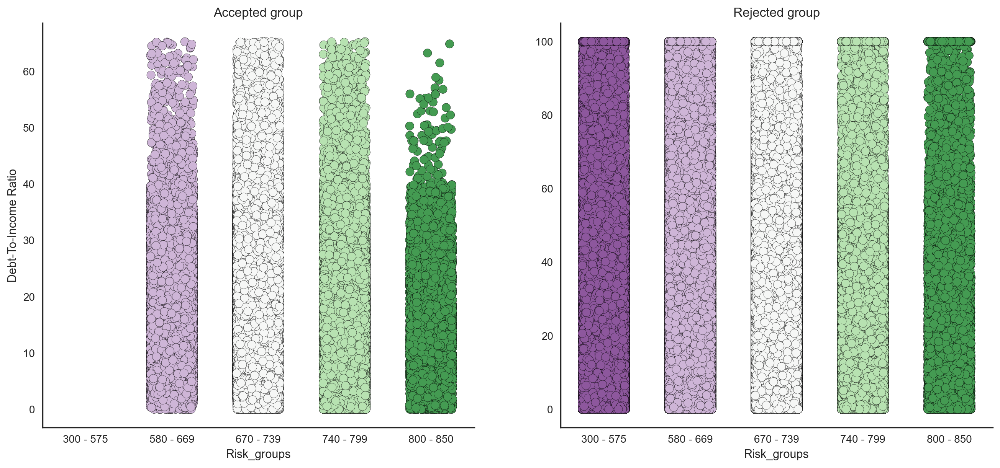

In [ ]:
plots = Plots(accepted_loan_df, rejected_loan_df)
plots.strip_plot_sub(
    "Risk_groups_acc",
    "dti",
    "Risk_groups",
    "Debt-To-Income Ratio",
    "Accepted group",
    "Rejected group",
)

From plots:

* Like last time, the rejected group is more densely packed than the another
* Most of people who received loan have **Good** risk score.
* There are no people with a rating in the accepted group **Poor**.

## 3.9  Loan title wordcloud

In this section, I will study which type of loan was most popular in both groups. This will help to identify the most common reasons for loans, we will be able to use this data as categorical in modeling part.

In [ ]:
loan_title = pd.DataFrame()
loan_title["Loan Title"] = rejected_loan_df["Loan Title"] + accepted_loan_df["title"]
loan_title = loan_title.dropna()

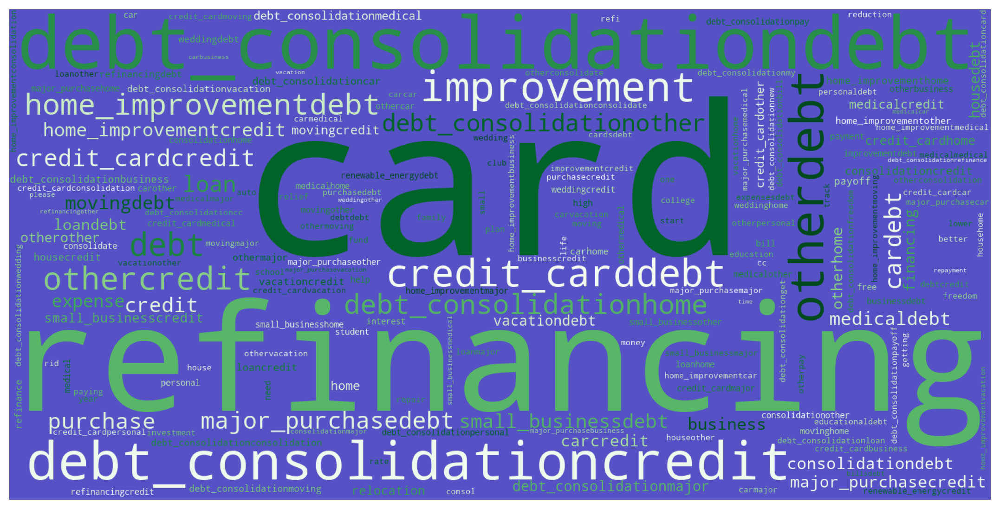

In [ ]:
word_cloud(loan_title, "Loan Title")

* Most common words are related to debts and cards
* Many words have to do with purchasing and buying
* In accepted group, quite often people refinanced their loans
* People have asked or used loans for medical needs
* Finally, a few words related to leisure

## 3.10  Work type

We have this data only for the accepted group, but it will still help us understand which specialists have received loans.

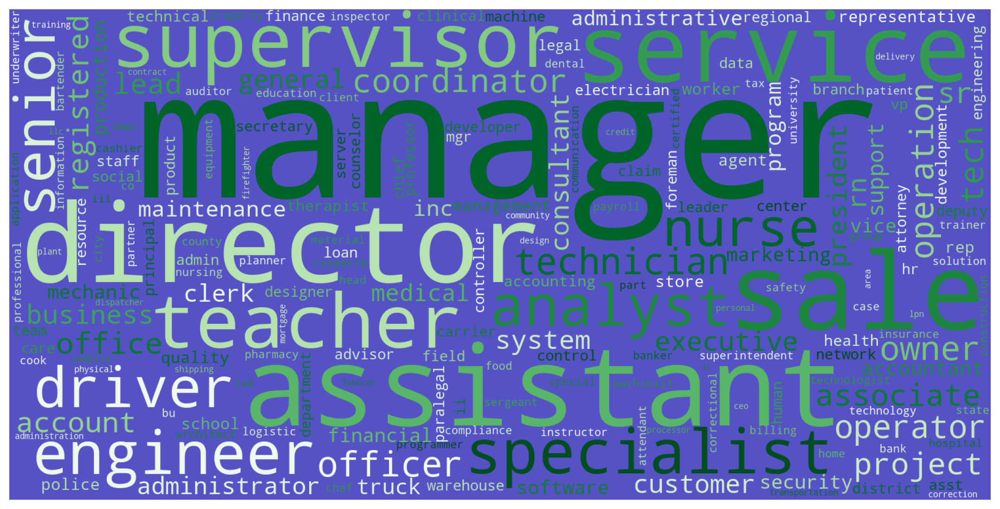

In [ ]:
employment_names = accepted_loan_df.dropna(subset=["emp_title"])
word_cloud(employment_names, "emp_title")

Insights
* The most popular role is manager, and most people are engaged in business
* There are people from the field of education and medicine
* Also we can other samller fields

This data also will be used in categorising data.

## 3.11 Loan grade and Annual income

Now I will study how different features affect the credit score. I will start with income and try to determine if there is any connection between these two characteristics.

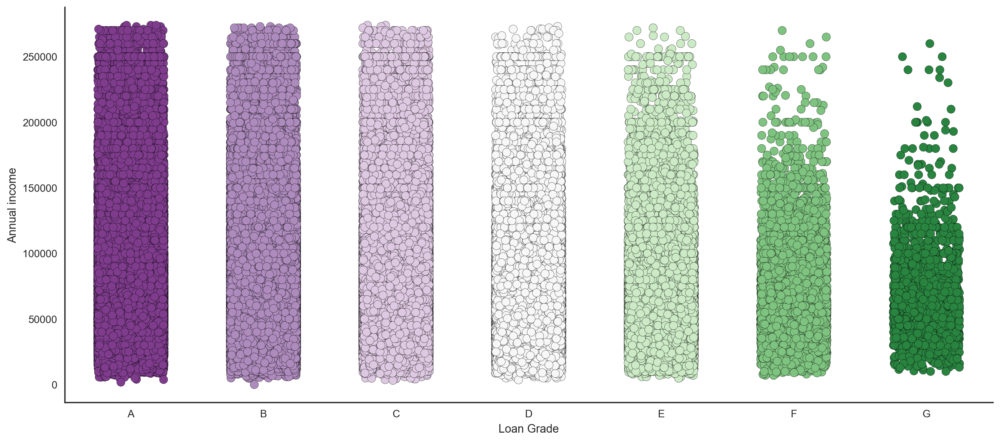

In [ ]:
accepted_loan_df = accepted_loan_df.sort_values("grade")

plots = Plots(accepted_loan_df, rejected_loan_df)
plots.strip_plot("grade", "annual_inc", "Loan Grade", "Annual income")

From plot
* People from groups A, B, and C. have the highest annual income. We can assume that income play a big role in getting a higher score. As with smaller grade people tend to have smaller income on average.
* On average, group G has the lowest income

## 3.12 Installment

The purpose of this section is to check how different contributions are between all grades.

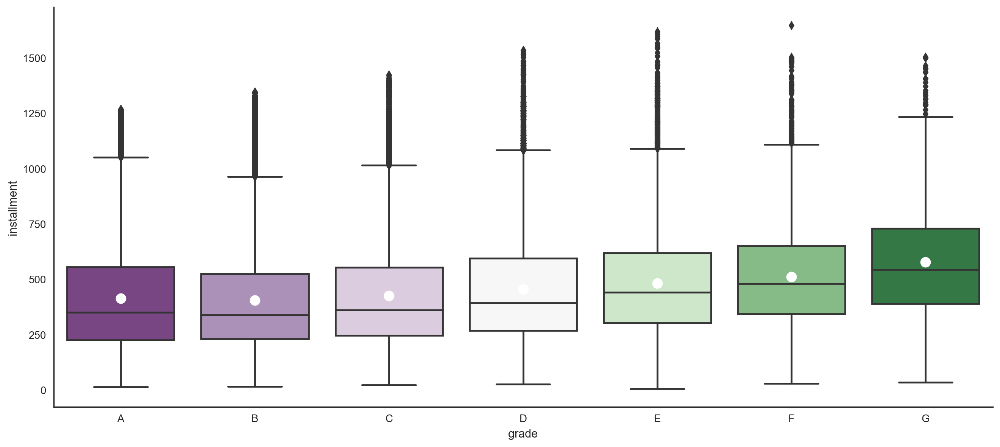

In [ ]:
plots.box_plot("grade", "installment")

* The installment is steadily increasing as the assessment gets worse.
* We can highlight some outliers that may indicate that with a larger loan comes a larger installments.
* In almost every class, the median and the mean are very different.

## 3.13 Loan grade and type of home ownership

Now I will study what type of real estate each group of people owns. This will help us identify the main groups of homeowners and highlight the connection between these two features.


In [ ]:
house_group = group_by(accepted_loan_df, ["home_ownership", "grade"], "grade")

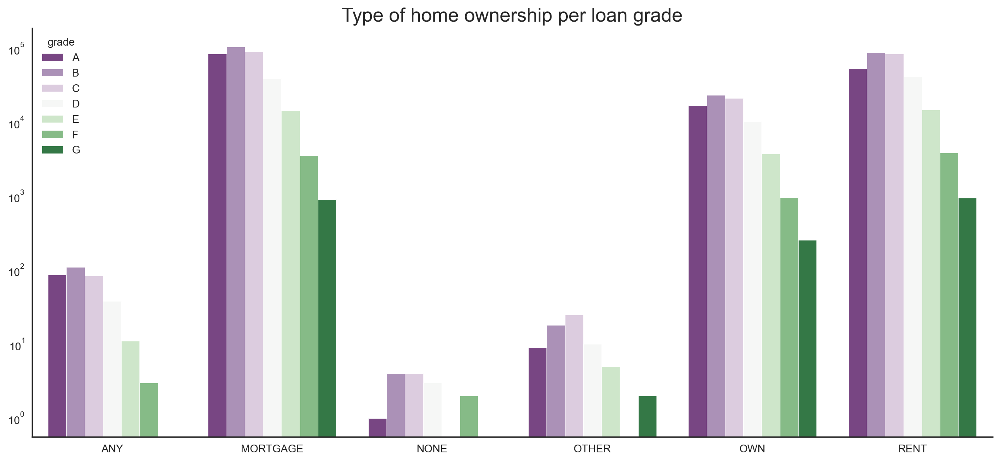

In [ ]:
plots = Plots(house_group, rejected_loan_df)
plots.bar_with_hue(
    "home_ownership", "total", "grade", "Type of home ownership per loan grade"
)

* There is two unknown categories **Any** and **None**. For the Ml modeling part, I will combine these two groups with **Others**, since I have no explanation of what these groups might mean.
* Representatives of Class B have the largest number of owned property. They also have the largest number of mortgages and rents.
* Class A is only the third-largest group in almost all homeowner groups.

## 3.14 Distribution of Debt to Income ratio

The main purpose of this part is to study the distribution of **DtI** (debt-to-income ratio) for each group. This may help to understand how credit scores can be assigned.

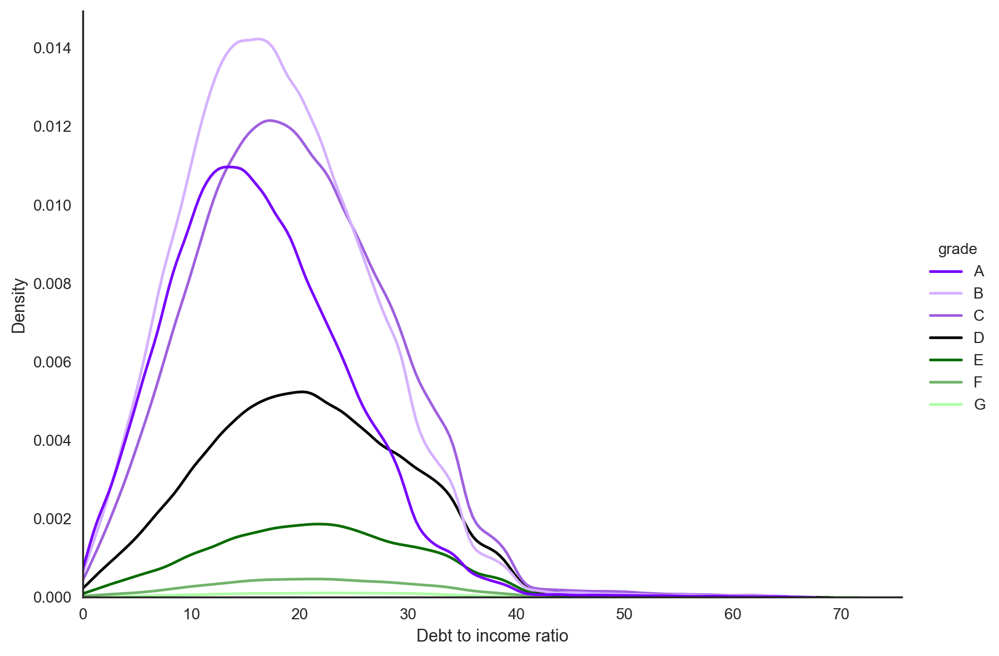

In [ ]:
plots.dist_plot_hue("dti", "grade", "Debt to income ratio")

From plot
* On average smallest dti have group A.
* It is clear that a smaller DtI is the better  score you will get.
* In addition, grades below D have fewer representatives.

## 3.15 Months since last delinquency

I believe that delinquency directly relates to solvency, which can also affect loan grade. In this part, I will study how months since the last delinquency differ between all groups.


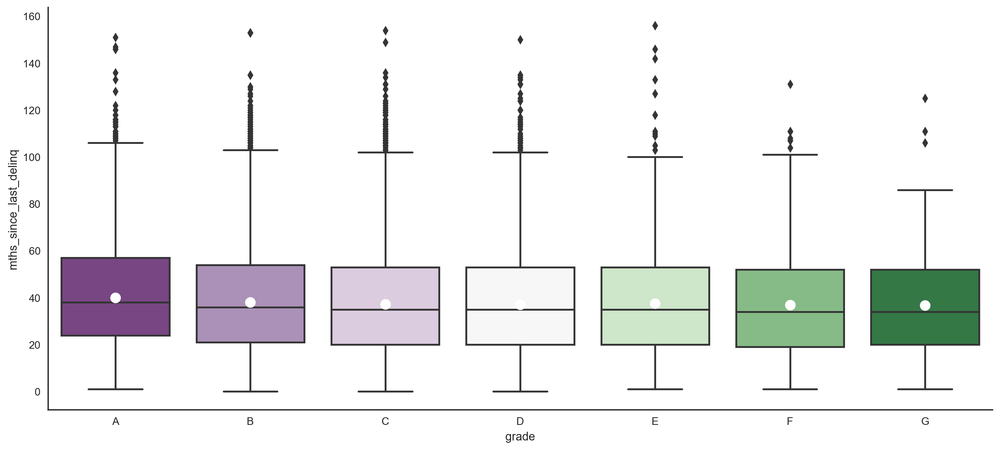

In [ ]:
plots.box_plot("grade", "mths_since_last_delinq")

Insights
* People from better groups  have longer periods since  last delinquency.
* Group **G** has the lowest median and smaller outliers compared to others.
* We can assume that the loan grade has a direct connection with the period that has passed since the last delinquency.

## 3.16 Application type

There are two types of applications. In this part, I will study the size difference between them.

In [ ]:
application_type = group_by(accepted_loan_df, ["application_type"], "application_type")

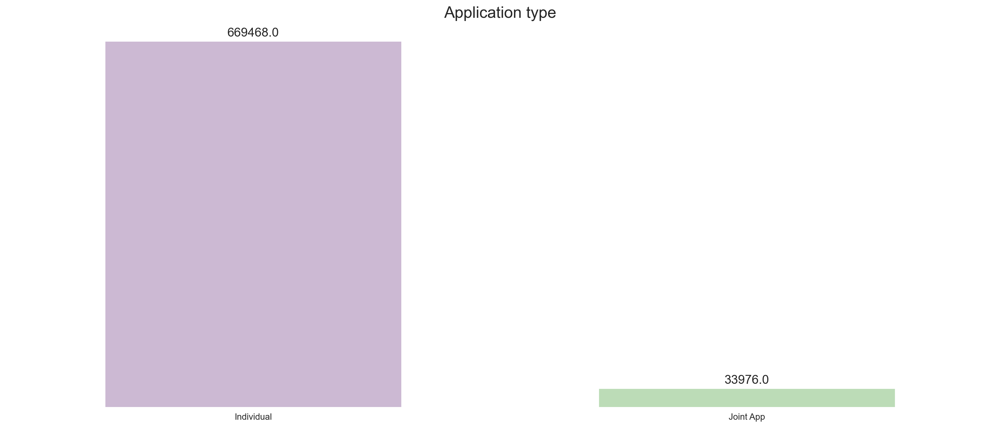

In [ ]:
plots = Plots(application_type, rejected_loan_df)
plots.bar_plot("application_type", "total", "Application type")

Insights
*  **Individual** loans are more popular compared to **Joint** application.

## 3.17 Balance-To-Limit Ratio

The balance-to-limit ratio is a comparison of the amount of credit being used to the total credit available to a borrower. The aim of this section is tho specifie this ratio for each group.

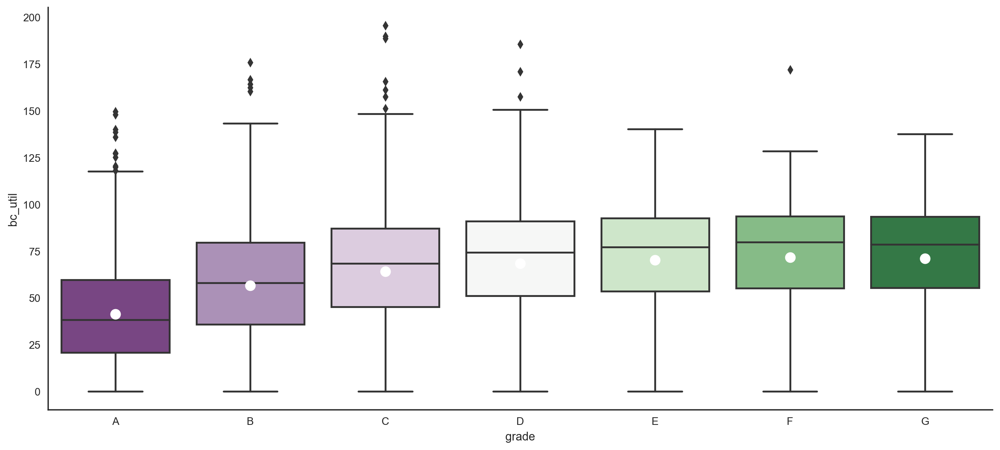

In [ ]:
plots.box_plot("grade", "bc_util")

From the  plot
* Best balance to limit ratio have groups with better grades.
* We can assume that people with lower grades tend to spend more of their borrowed money.

## 3.18 Current balance

The purpose of this part is to check previous section assumptions and compare the current balance between various groups.

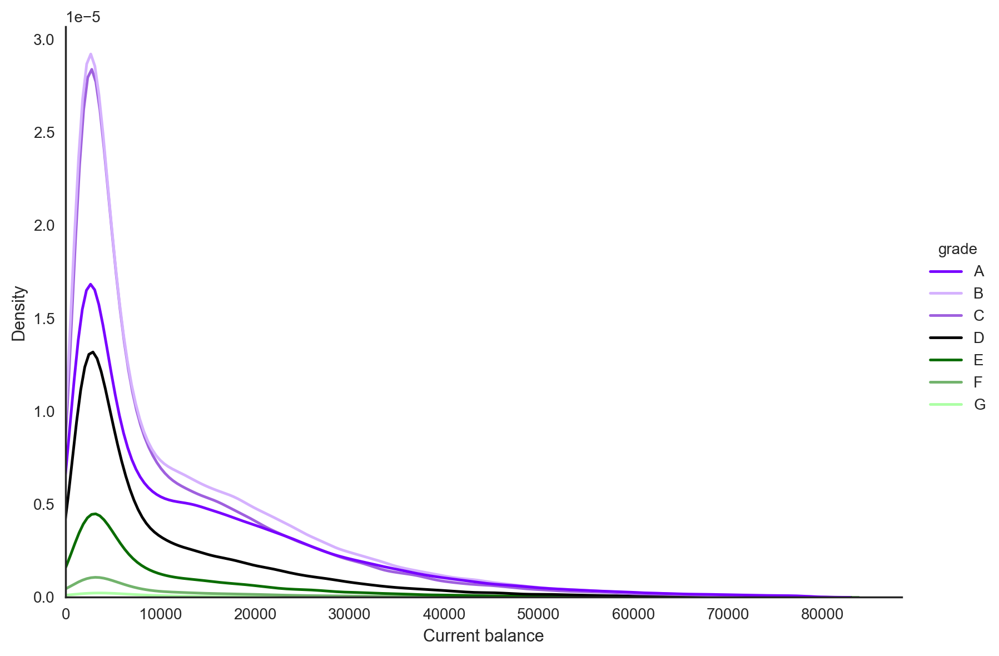

In [ ]:
plots.dist_plot_hue("avg_cur_bal", "grade", "Current balance")

* All charts are right-skewed, but groups below **D** loan grade have smaller current balances compared to others.
* Also, values starting from 50 000 we can call outliers, mainly such values are more common for groups **A** and **B**.

## 3.19 Hardship loans

A hardship loan can be any money you borrow  when your vehicle breaks down, someone in your household loses their job or a family member requires expensive medical care.
The aim of this subpart is to check how many people took such loans, reasons and amount.

### 3.19.1 Total number

In [ ]:
hardship = group_by(accepted_loan_df, ["hardship_reason"], "hardship_reason")
Total = hardship["total"].sum()
print(
    f"The total number of people who were forced to take out a hardship loan: {Total}"
)

The total number of people who were forced to take out a hardship loan: 1521


### 3.19.2 Reasons for hardship loan

In [ ]:
hardship.style.apply(
    lambda x: ["background: #5651c5" if x.name in [2, 6] else "" for i in x],
    axis=1,
)

,hardship_reason,total
0,DISABILITY,19
1,DIVORCE,19
2,EXCESSIVE_OBLIGATIONS,229
3,FAMILY_DEATH,23
4,INCOME_CURTAILMENT,140
5,MEDICAL,156
6,NATURAL_DISASTER,658
7,REDUCED_HOURS,60
8,UNEMPLOYMENT,217


* Most common reason for hardship loan is **Natural Disaster**.
* Second is excessive obligation it could mean that this people have additional debts.

### 3.19.3 Hardship loan size


In [ ]:
plots.box_plot("hardship_reason", "hardship_amount")

* The largest loans were taken out due to disability, reduced income and unemployment.
* The smallest loans were taken by representatives of the divorce group.

## 3.19.4 Grade vs Loan size

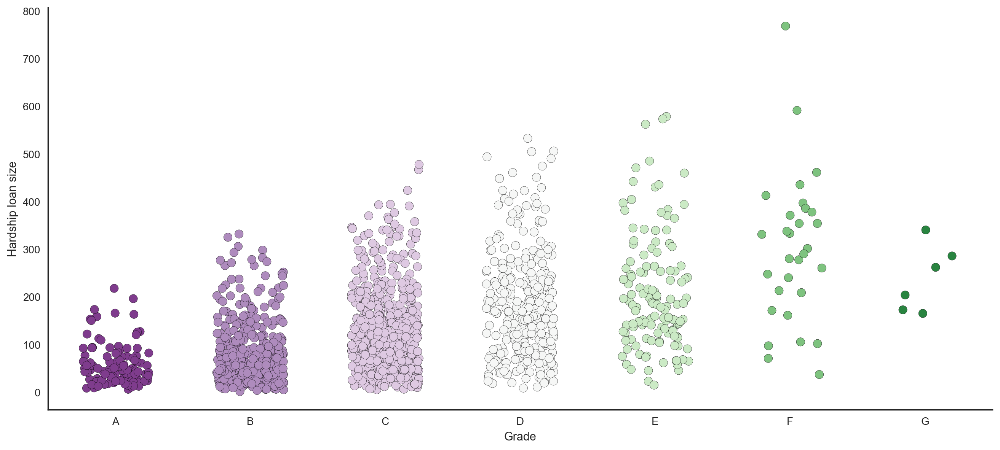

In [ ]:
plots.strip_plot("grade", "hardship_amount", "Grade", "Hardship loan size")

From the plot
* Smallest amount of people who took hardship loans are from **E, F, G** groups.
* **C** group is largest compared to others.
* We can assume that this type of loan is more likely to be received by a person with a higher credit rating. This may happen because the main purpose of these loans are extreme situations, and this means that less reliable people probably won't pay off the debt.

## 3.20 Revolving bank account

A revolving account is a type of credit account that provides a borrower with a maximum limit and allows for varying credit availability. Revolving accounts do not have a specified maturity date and can remain open as long as a borrower remains in good standing with the creditor. I will focus on the balance size of each group of accounts of this type.

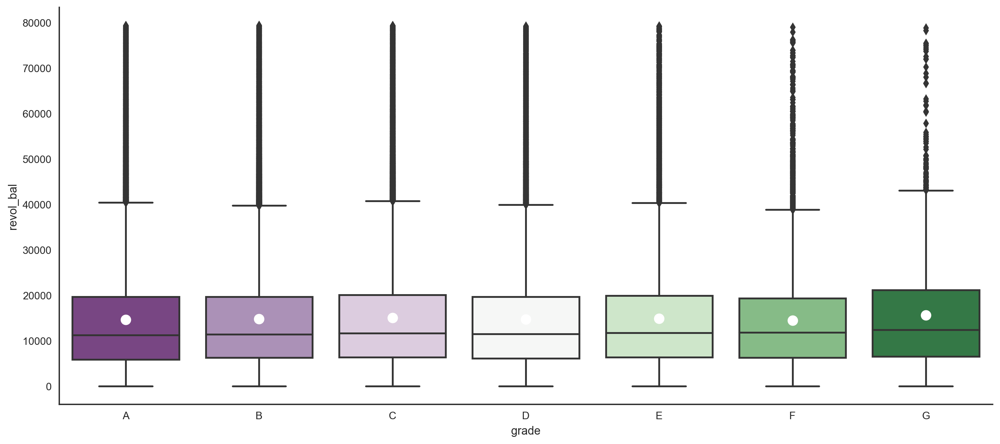

In [ ]:
plots.box_plot("grade", "revol_bal")

Insights
* Almost all groups have the same balance size, with the exception of the lowest grade **G**. It has the highest average and median size compared to others. This is quite surprising, since this group is the least real.

## 3.21 Correlation

The purpose of the last part is to determine the correlation between the grade and the subgrade and other features. Since we have about 150 features, I will only display data above the 0.3 threshold.

In [ ]:
sub_grade = accepted_loan_df["sub_grade"].unique().tolist()
number_of_subgrades = list(range(35))

In [ ]:
accepted_loan_df["grade"].replace(
    ["A", "B", "C", "D", "E", "F", "G"], [0, 1, 2, 3, 4, 5, 7], inplace=True
)
accepted_loan_df["sub_grade"].replace(sub_grade, number_of_subgrades, inplace=True)

In [ ]:
correlation_matrix = accepted_loan_df.corr()
correlation_matrix = correlation_matrix[["grade", "sub_grade"]]
correlation_matrix = correlation_matrix.sort_values("grade")
correlation_matrix = correlation_matrix.loc[
    (correlation_matrix["sub_grade"] >= 0.3) | (correlation_matrix["sub_grade"] <= -0.3)
].reset_index()
correlation_matrix = correlation_matrix[
    correlation_matrix["index"].str.contains("grade") == False
]

In [ ]:
correlation_matrix.style.apply(
    lambda x: ["background: #5651c5" if x.name in [0, 12] else "" for i in x],
    axis=1,
)

,index,grade,sub_grade
0,fico_range_low,-0.436092,-0.419428
1,fico_range_high,-0.436088,-0.419424
2,sec_app_fico_range_low,-0.369086,-0.355753
3,sec_app_fico_range_high,-0.369086,-0.355753
4,last_fico_range_high,-0.333894,-0.320424
5,last_fico_range_low,-0.333893,-0.320424
6,bc_open_to_buy,-0.331929,-0.317797
7,bc_util,0.318079,0.305769
8,all_util,0.320626,0.306911
9,total_rec_int,0.426728,0.412320


* The strongest positive correlation is observed between the interest rate and the grade/subgrade. We can assume that this happened due to grade direct impact on the amount that the lender charges the borrower, and is a percentage of the principal amount — the amount loaned.
* Almost only risk scores have negative correlation with grade/subgrade.
* Also various account balances have positive correlations with the target.

# Conclusion

* The largest number of rejected and approved loans are in the following states: California, Texas, New York, Florida.At the same time, these states are the most populated compared to others.
* The distribution is left skewed and it shows that a person on average has an annual income of 100,000.
* In the rejected group, people asked for larger amounts compared to the other group
* The number of rejected loans was growing up to 2011
* Most common words are related to debts and cards. I assume this comes frome rejected group 
* The most popular role is manager, and most people are engaged in business
* Income have big impact on the loan grade
* The installment is steadily increasing as the assessment gets worse
* Representatives of Class B have the largest number of owned property. They also have the largest number of mortgages and rents
* Individual loans are more popular compared to Joint application
* Most common reason for hardship loan is Natural Disaster
* Smallest amount of people who took hardship loans are from E, F, G groups
* In general, we were able to identify a significant difference in the main characteristics, such as dti, fico income, etc., between the two groups. I assume that this difference will play a major role in the construction of our forecasting model